# Confocal-FlowCam Calibration

The goal of this notebook is to extract confocal LIF data for comparison with FlowCam data 

Last edited by HVM on 13 February 2024

In [3]:
# Install packages
!pip install read_lif
!pip install matplotlib
!pip install pandas


[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [4]:
# Load commands / packages
import os
import requests
from skimage.io import imshow
from skimage.measure import find_contours
import numpy as np

import matplotlib.pyplot as plt

import read_lif

from scipy.ndimage import label, find_objects

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

from scipy.spatial import ConvexHull

from matplotlib.path import Path
from matplotlib.patches import PathPatch

import pandas as pd 

import glob

/var/folders/tb/lzmq4mdn7c722pl9fd3cgc980000gn/T/ipykernel_19979/2369213009.py:22: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## Practice importing files and generating images of the 3 channels

In [9]:
# Load filenames
D1_file_vector = ["/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/FlowCamCalibration/Confocal/LIFs/F12_D17_MR+HP+TA_C_Data.lif"]


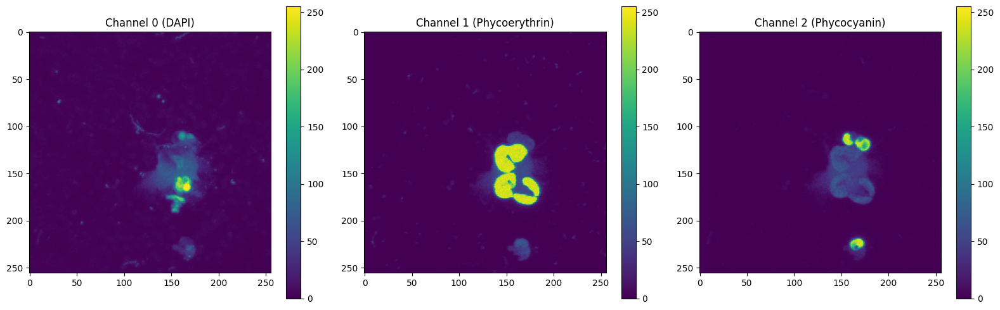

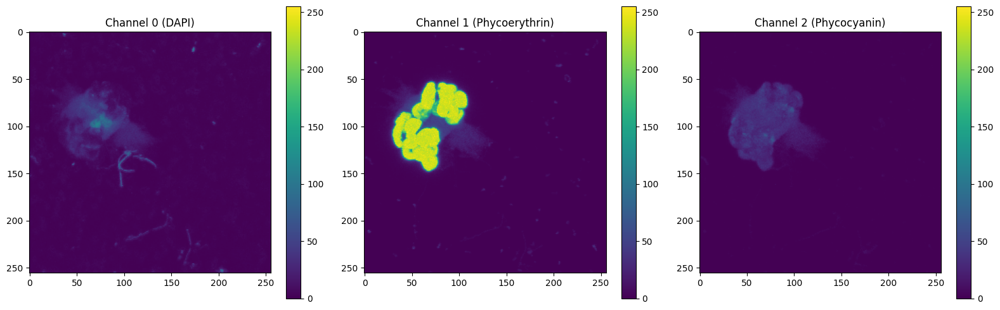

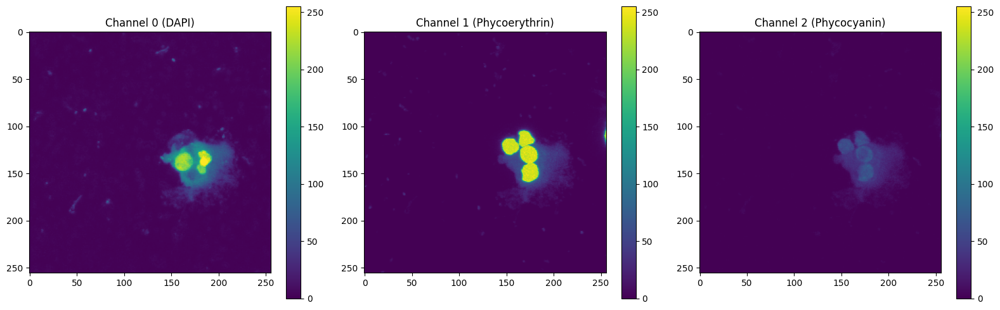

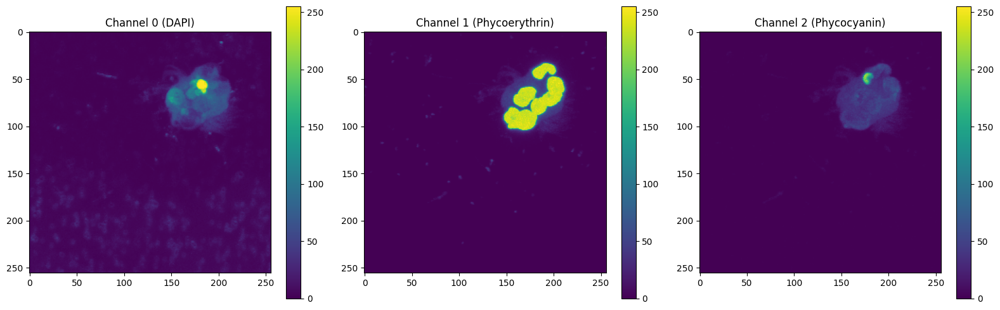

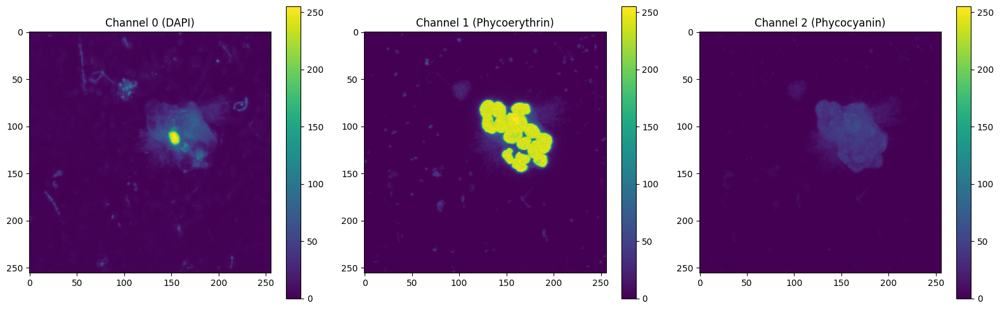

...

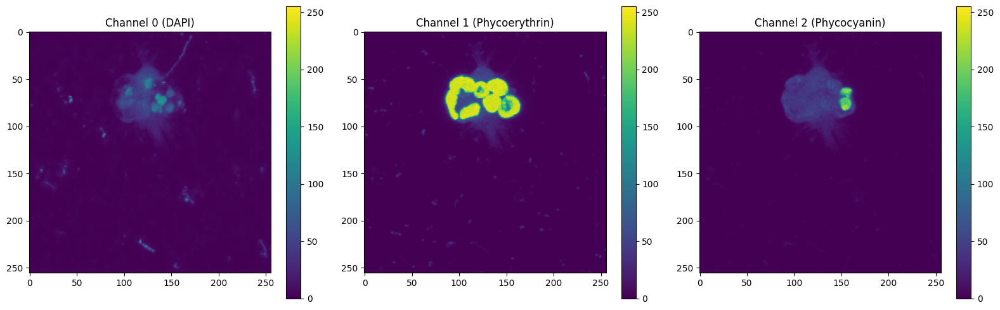

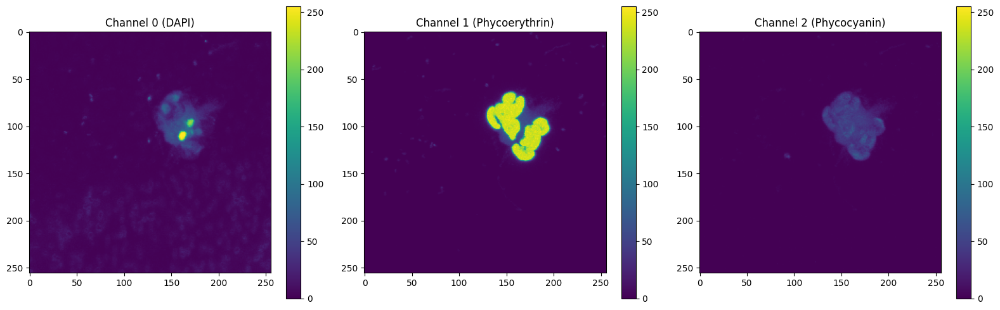

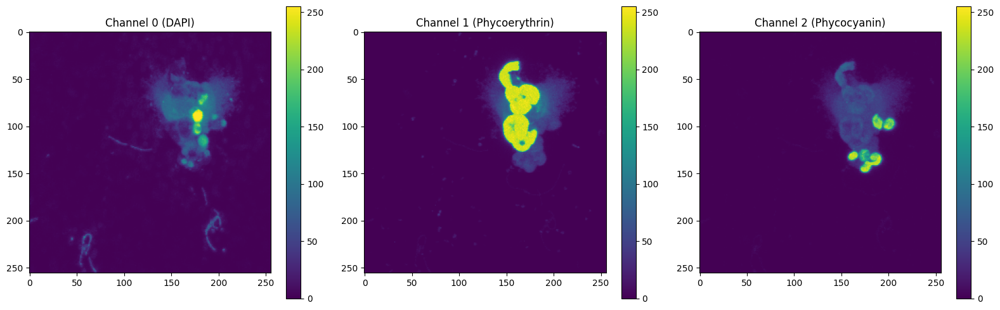

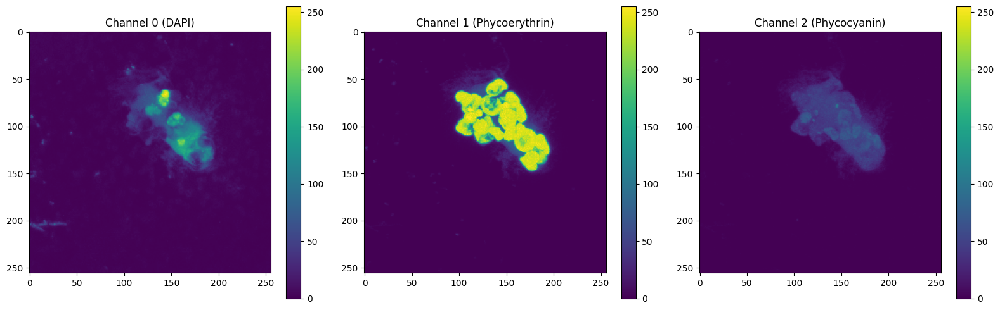

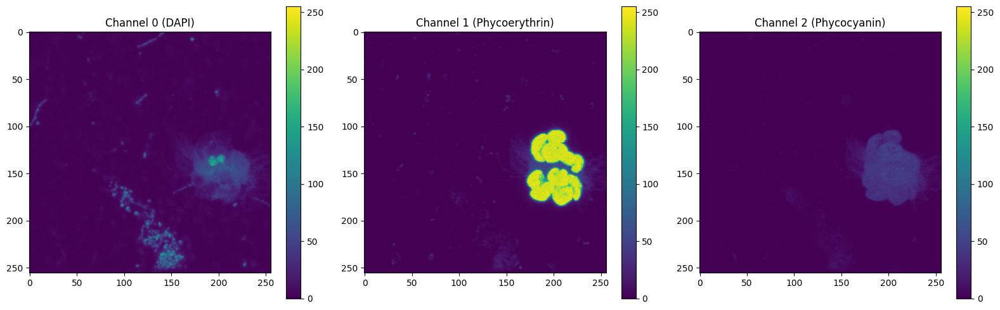

In [10]:
vminset = 0
vmaxset = 255

imgtitles = ['Channel 0 (DAPI)','Channel 1 (Phycoerythrin)','Channel 2 (Phycocyanin)']

for filectr in range(0,len(D1_file_vector)):
    filename = D1_file_vector[filectr] # record the filename as a variable for later use in naming
    reader = read_lif.Reader(filename) # extract the data
    series = reader.getSeries() # extract the list of series

    for stack_choice in range(0,len(series)):
        chosen = series[stack_choice]  # choose z stack
        
        fig, axs = plt.subplots(1, 3, figsize=(16, 5))  # 1 rows, 4 columns

        for channel_choice in range(0,3):
            image = chosen.getFrame(T=0,channel=channel_choice)
            img1 = axs[channel_choice].imshow(np.max(image, axis=0), cmap='viridis', vmin=vminset, vmax=vmaxset)
            axs[channel_choice].set_title(imgtitles[channel_choice])
            cbar1 = plt.colorbar(img1,ax=axs[channel_choice])
        
        # Adjust layout
        plt.tight_layout()
        
        # Show the plots
        #plt.show()
        plt.savefig("/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/FlowCamCalibration/Confocal/LIFs/Images/"+os.path.splitext(os.path.basename(filename))[0]+str(stack_choice)+".png")


## Data extraction and processing

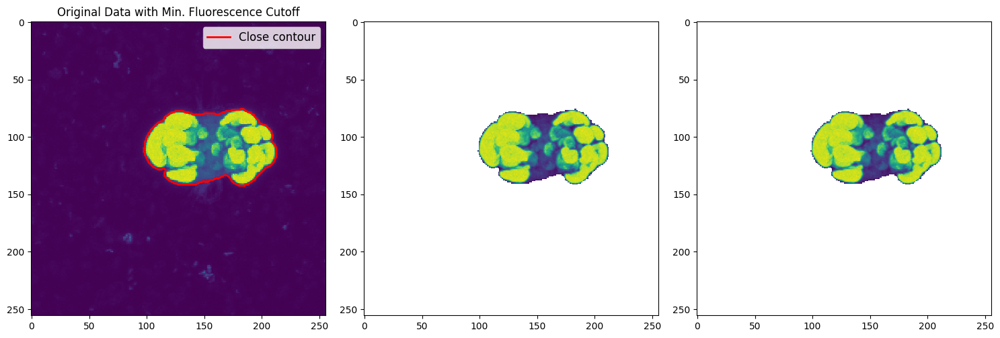

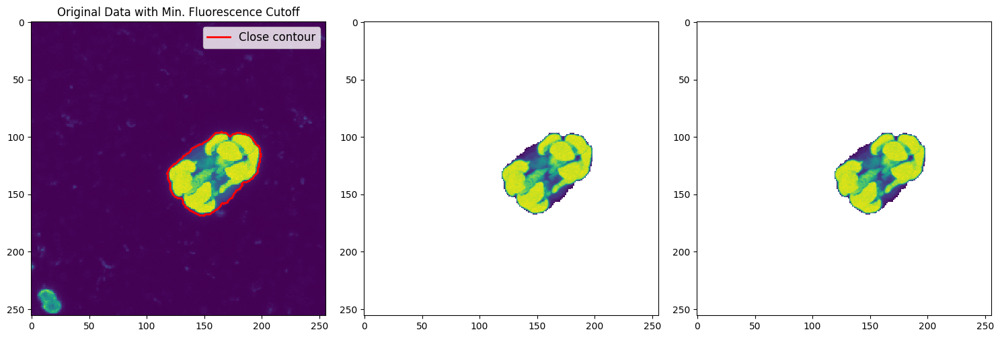

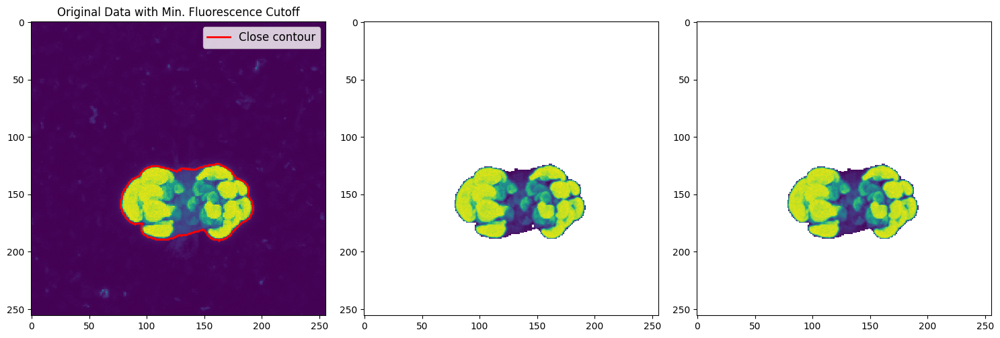

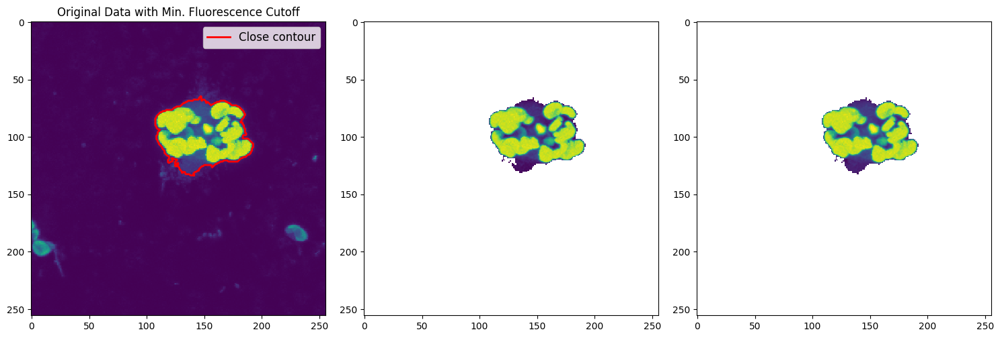

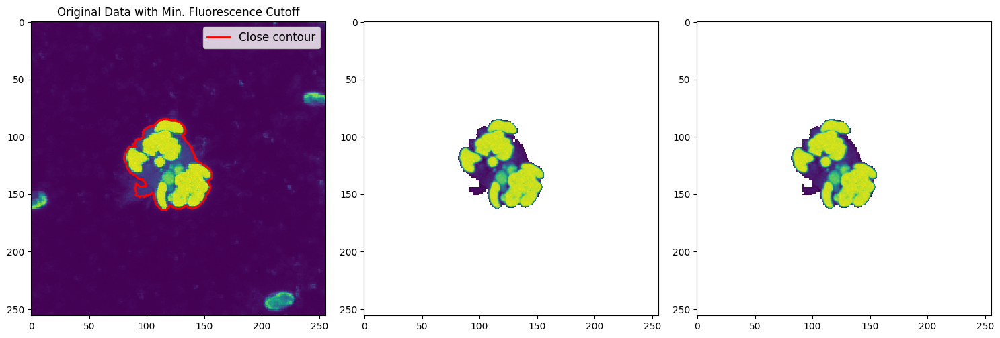

...

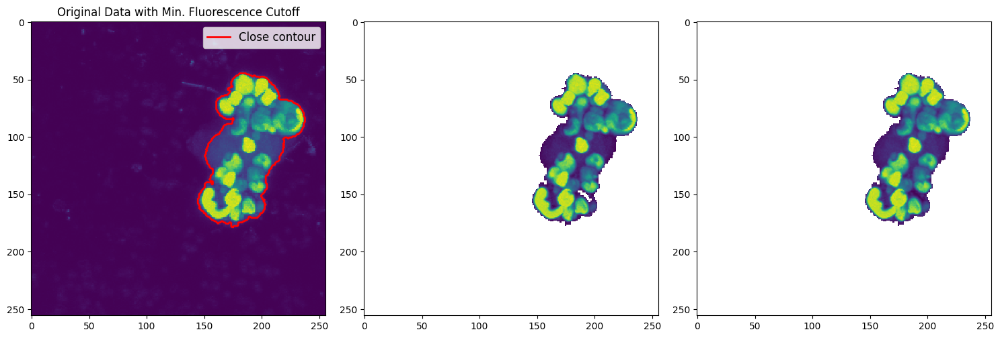

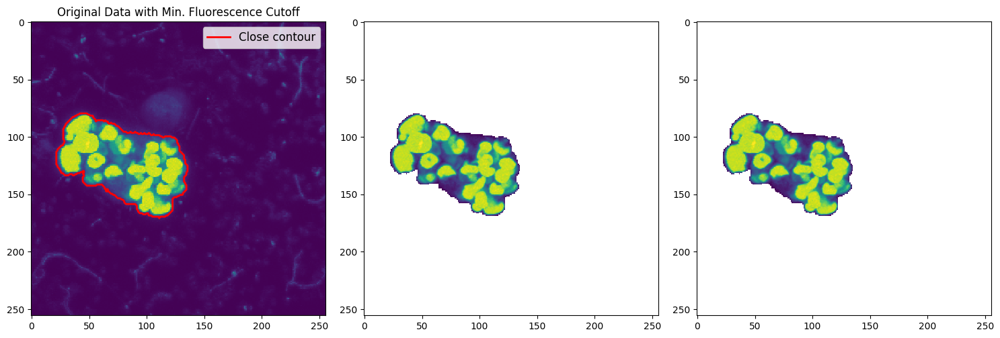

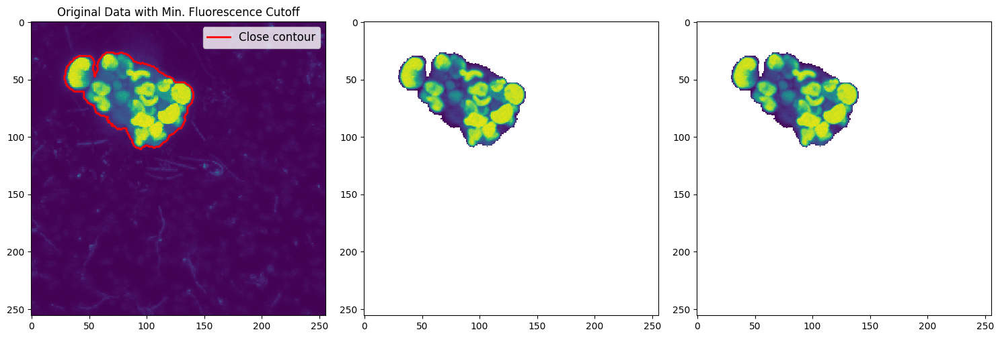

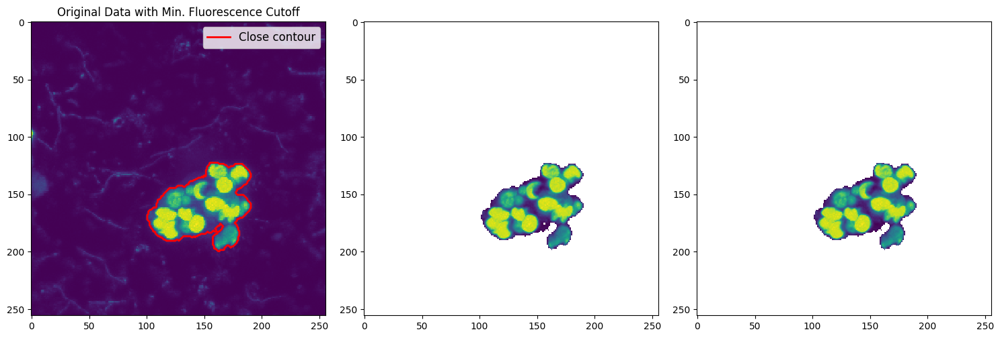

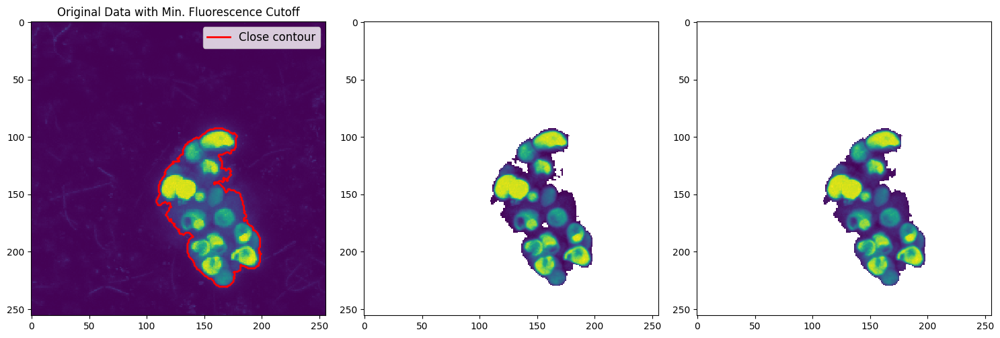

In [5]:
# Boundaries around cells

base_fluor_threshold = 30 # threshold for base fluorescence

for filectr in range(0,len(D1_file_vector)):
    filename = D1_file_vector[filectr] # record the filename as a variable for later use in naming
    reader = read_lif.Reader(filename) # extract the data
    series = reader.getSeries() # extract the list of series

    for stack_choice in range(0,len(series)):
        chosen = series[stack_choice]  # choose z stack
        
        # Base layer from composite fluorescence
        image0 = chosen.getFrame(T=0, channel = 0) # DAPI fluorescence
        image1 = chosen.getFrame(T=0, channel = 1) # PE fluorescence
        image2 = chosen.getFrame(T=0, channel = 2) # PC fluorescence
        layer = np.max([image0,image1,image2], axis=0) 
        layer2 = np.max(layer,axis=0)
        layer = layer2
        
        # Create a binary mask
        binary_mask = np.where(layer > base_fluor_threshold, 1, 0)  # Adjust the threshold and alpha values as needed
        
        # Label connected components in the binary mask
        labeled_mask, num_labels = label(binary_mask)
        
        # Find the sizes of the labeled components
        component_sizes = np.bincount(labeled_mask.flat)[1:]
        
        # Find the label of the largest component
        largest_component_label = np.argmax(component_sizes) + 1
        
        # Extract the largest component using its label
        largest_component = (labeled_mask == largest_component_label)
        
        # Optional: Draw the convex hull around the largest component
        nonzero_indices = np.column_stack(np.nonzero(largest_component))
        hull = ConvexHull(nonzero_indices, qhull_options='QJ Pp')
        
        # Plot the original data and the identified largest patch
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        axes[0].imshow(layer2, cmap='viridis', interpolation='none')
        axes[0].set_title('Original Data with Min. Fluorescence Cutoff')
        
        # Find contours of the largest component
        contours = find_contours(largest_component, 0.5, fully_connected='high')
        boundary = max(contours, key=len) # Choose the longest contour (boundary)
        axes[0].plot(boundary[:, 1], boundary[:, 0], 'r-', lw=2,label='Close contour')
        axes[0].legend(fontsize='large')
        
        # Plot the trimmed data
        biggest_cell_mask = largest_component*layer
        trimmed_data = np.where(biggest_cell_mask > 0, biggest_cell_mask, np.nan)
        axes[1].imshow(trimmed_data)

        # Another way of trimming
        # Create a Path object from the polygon vertices
        path = Path(boundary)
        
        # Create a blank mask image with the same dimensions as the original image
        mask = np.zeros(layer.shape[:2], dtype=np.uint8)
        
        # Draw the polygon on the mask
        rr, cc = np.meshgrid(np.arange(layer.shape[1]), np.arange(layer.shape[0]))
        points = np.vstack((cc.flatten(), rr.flatten())).T
        mask[path.contains_points(points).reshape(layer.shape[:2])] = True
        
        # Apply the mask to the original image
        shaded_image = np.copy(layer)

        # Plot the trimmed data
        biggest_cell_mask = mask*layer
        trimmed_data = np.where(biggest_cell_mask > 0, biggest_cell_mask, np.nan)
        
        # Display the trimmed image
        axes[2].imshow(trimmed_data)
        
        plt.tight_layout()
        plt.show()

#plt.savefig("Maskingbycell_Demo.png")

In [6]:
# Test run

filectr = 0;
stack_choice = 7;
base_fluor_threshold = 30;
num_channels = 3;
threshold_cell = 20 # cutoff for the 3-channel stack to say "this is a cell"
threshold0 = 50 # cutoff for DAPI fluorescence
threshold1 = 50 # cutoff for PE fluorescence
threshold2 = 75 # cutoff for PC fluorescence


# Load the z-stack

filename = D1_file_vector[filectr] # record the filename as a variable for later use in naming
reader = read_lif.Reader(filename) # extract the data
series = reader.getSeries() # extract the list of series
chosen = series[stack_choice]  # choose z stack

# find the trimming region
# Base layer from composite fluorescence
image0 = chosen.getFrame(T=0, channel = 0) # DAPI fluorescence
image1 = chosen.getFrame(T=0, channel = 1) # PE fluorescence
image2 = chosen.getFrame(T=0, channel = 2) # PC fluorescence
layer = np.max([image0,image1,image2], axis=0) 
layer2 = np.max(layer,axis=0)
layer = layer2

# Create a binary mask
binary_mask = np.where(layer > base_fluor_threshold, 1, 0)  # Adjust the threshold and alpha values as needed

# Label connected components in the binary mask
labeled_mask, num_labels = label(binary_mask)

# Find the sizes of the labeled components
component_sizes = np.bincount(labeled_mask.flat)[1:]

# Find the label of the largest component
largest_component_label = np.argmax(component_sizes) + 1

# Extract the largest component using its label
largest_component = (labeled_mask == largest_component_label)

# Find contours of the largest component
contours = find_contours(largest_component, 0.5, fully_connected='high')
boundary = max(contours, key=len) # Choose the longest contour (boundary)
axes[0].plot(boundary[:, 1], boundary[:, 0], 'r-', lw=2,label='Close contour')
axes[0].legend(fontsize='large')

# Create a Path object from the boundary polygon vertices
path = Path(boundary)

# Create a blank mask image with the same dimensions as the original image
mask = np.zeros(layer.shape[:2], dtype=np.uint8)

# Draw the polygon on the mask
rr, cc = np.meshgrid(np.arange(layer.shape[1]), np.arange(layer.shape[0]))
points = np.vstack((cc.flatten(), rr.flatten())).T
mask[path.contains_points(points).reshape(layer.shape[:2])] = True

# Trim the data
biggest_cell_mask = mask*layer
trimmed_data = np.where(biggest_cell_mask > 0, biggest_cell_mask, np.nan)

# Calculate statistics slice-by-slice
image = chosen.getFrame(T=0, channel = 0)
stack_array = np.full([image.shape[0],5], np.nan) 

for k in range(0,image.shape[0]): # For each slice, extract and compile its layers
    # Create an empty array for image data
    image_array = np.empty((num_channels, image.shape[1], image.shape[2]))
    
    # Fill the array channel-by-channel
    for z in range(0,num_channels):
        image_array[z, :, :] = chosen.getFrame(T=0,channel=z)[k] 

    # Sum the channels
    image_array_sum0 = np.sum(image_array, axis=0)

    # Perform calculations
    binary_layer = image_array_sum0*mask > threshold_cell
    binary_c0 = image_array[0,:,:]*mask > threshold0
    binary_c1 = image_array[1,:,:]*mask > threshold1
    binary_c2 = image_array[2,:,:]*mask > threshold2

    # Save findings for each slice
    stack_array[k,0] = sum(sum(binary_layer)) # number of pixels in this image that contain data
    stack_array[k,1] = sum(sum(binary_c0)) # number of pixels in this image that contain DAPI fluorescence
    stack_array[k,2] = sum(sum(binary_c1)) # number of pixels in this image that contain phycoerythrin fluorescence
    stack_array[k,3] = sum(sum(binary_c2)) # number of pixels in this image that contain phycocyanin fluorescence
    stack_array[k,4] = binary_layer.size # number of pixels in this image (any fluorescence)

# Calculate statistics for the stack
#data_array[filectr,j,0] = sum(stack_array[:,0])/sum(stack_array[:,4]) # proportion of zstack that is the cell
#data_array[filectr,j,1] = sum(stack_array[:,1])/sum(stack_array[:,0]) # proportion of the cell that is DAPI fluorescent
#data_array[filectr,j,2] = sum(stack_array[:,2])/sum(stack_array[:,0]) # proportion of the cell that is PE fluorescent
#data_array[filectr,j,3] = sum(stack_array[:,3])/sum(stack_array[:,0]) # proportion of the cell that is PC fluorescent

sizecell = sum(stack_array[:,0]) # size of the cell in pixels
propDAPI = sum(stack_array[:,1])/sum(stack_array[:,0]) # proportion of the cell that is DAPI fluorescent
propPE = sum(stack_array[:,2])/sum(stack_array[:,0]) # proportion of the cell that is PE fluorescent
propPC = sum(stack_array[:,3])/sum(stack_array[:,0]) # proportion of the cell that is PC fluorescent

print(sizecell)
print(propDAPI)
print(propPE)
print(propPC)


128386.0
0.06335581761251227
0.30507220413440717
0.030151262598725716


In [8]:
# Iterating across all data
base_fluor_threshold = 30;
num_channels = 3;
threshold_cell = 20 # cutoff for the 3-channel stack to say "this is a cell"
threshold0 = 50 # cutoff for DAPI fluorescence
threshold1 = 50 # cutoff for PE fluorescence
threshold2 = 75 # cutoff for PC fluorescence

# Make a list of all LIF files in the directory:
file_vector = (glob.glob("/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/FlowCamCalibration/Confocal/LIFs/*.lif")) 

# Work through the data, one LIF file at a time
for filectr in range(0,len(file_vector)): # for each file
    filename = file_vector[filectr] # record the filename as a variable for later use in naming
    reader = read_lif.Reader(filename) # extract the data
    series = reader.getSeries() # extract the list of series 
    data_array = np.full([len(series),4], np.nan) # Create an array of NaNs to hold data 
    
    for j in range(0,len(series)): # for each stack in the file
        # Choose the stack and extract its metadata
        chosen = series[j]  # choose z stack

        # Generate a mask for the Mesodinium cell
        # Base layer from composite fluorescence
        image0 = chosen.getFrame(T=0, channel = 0) # DAPI fluorescence
        image1 = chosen.getFrame(T=0, channel = 1) # PE fluorescence
        image2 = chosen.getFrame(T=0, channel = 2) # PC fluorescence
        layer = np.max([image0,image1,image2], axis=0) 
        layer2 = np.max(layer,axis=0)
        layer = layer2
        
        binary_mask = np.where(layer > base_fluor_threshold, 1, 0)  # Create a binary mask
        labeled_mask, num_labels = label(binary_mask) # Label connected components in the binary mask
        component_sizes = np.bincount(labeled_mask.flat)[1:] # Find the sizes of the labeled components
        largest_component_label = np.argmax(component_sizes) + 1 # Find the label of the largest component
        largest_component = (labeled_mask == largest_component_label) # Extract the largest component using its label
        contours = find_contours(largest_component, 0.5, fully_connected='high') # Find contours of the largest component
        boundary = max(contours, key=len) # Choose the longest contour (boundary)
        path = Path(boundary) # Create a Path object from the boundary polygon vertices
        mask = np.zeros(layer.shape[:2], dtype=np.uint8) # Create a blank mask image with the same dimensions as the original image
        
        rr, cc = np.meshgrid(np.arange(layer.shape[1]), np.arange(layer.shape[0])) # Draw the polygon on the mask
        points = np.vstack((cc.flatten(), rr.flatten())).T # Find the points within the mask that are inside of the polygon
        mask[path.contains_points(points).reshape(layer.shape[:2])] = True # Include these points within the mask

        # Calculate statistics slice-by-slice
        image = chosen.getFrame(T=0, channel = 0)
        stack_array = np.full([image.shape[0],5], np.nan) 
        
        for k in range(0,image.shape[0]): # For each slice, extract and compile its layers
            # Create an empty array for image data
            image_array = np.empty((num_channels, image.shape[1], image.shape[2]))
            
            # Fill the array channel-by-channel
            for z in range(0,num_channels):
                image_array[z, :, :] = chosen.getFrame(T=0,channel=z)[k] 

            # Sum the channels
            image_array_sum0 = np.sum(image_array, axis=0)

            # Perform calculations
            binary_layer = image_array_sum0*mask > threshold_cell
            binary_c0 = image_array[0,:,:]*mask > threshold0
            binary_c1 = image_array[1,:,:]*mask > threshold1
            binary_c2 = image_array[2,:,:]*mask > threshold2

            # Save findings for each slice
            stack_array[k,0] = sum(sum(binary_layer)) # number of pixels in this image that contain data
            stack_array[k,1] = sum(sum(binary_c0)) # number of pixels in this image that contain DAPI fluorescence
            stack_array[k,2] = sum(sum(binary_c1)) # number of pixels in this image that contain phycoerythrin fluorescence
            stack_array[k,3] = sum(sum(binary_c2)) # number of pixels in this image that contain phycocyanin fluorescence

        # Calculate statistics for the stack
        data_array[j,0] = sum(stack_array[:,0]) # size of the cell in pixels
        data_array[j,1] = sum(stack_array[:,1])/sum(stack_array[:,0]) # proportion of the cell that is DAPI fluorescent
        data_array[j,2] = sum(stack_array[:,2])/sum(stack_array[:,0]) # proportion of the cell that is PE fluorescent
        data_array[j,3] = sum(stack_array[:,3])/sum(stack_array[:,0]) # proportion of the cell that is PC fluorescent

    #print(data_array) # Enable this line to print the data as you go through
    df = pd.DataFrame(data_array)
    df.to_csv("/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/FlowCamCalibration/Confocal/CSVs/"+os.path.splitext(os.path.basename(filename))[0]+"_processeddata.csv")




# Examining high-quality images

In [5]:
# Load file location
D1_file_vector = ["/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D01_HPFed_HighQuality.lif",
                 "/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D03_HPFed_HighQuality.lif",
                  "/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D12_HPFed_HighQuality.lif",
                  "/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D15_HPFed_HighQuality.lif",
                 "/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D17_MR+HP+TA_HighQuality.lif",
                 "/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/D03_Starved_HighQuality.lif"]


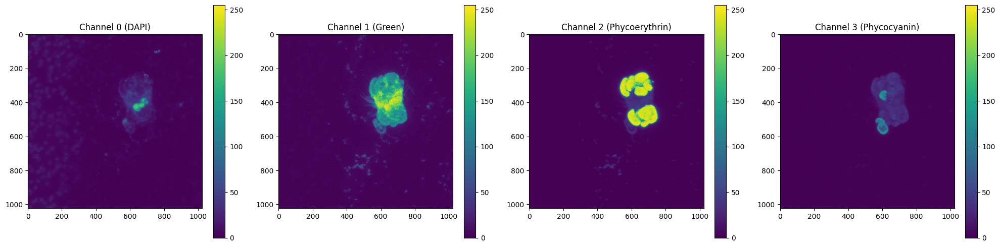

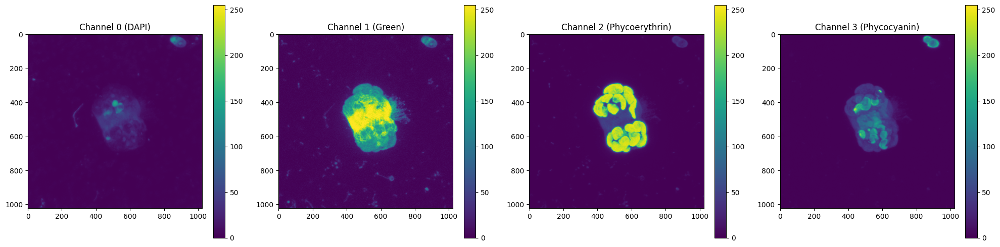

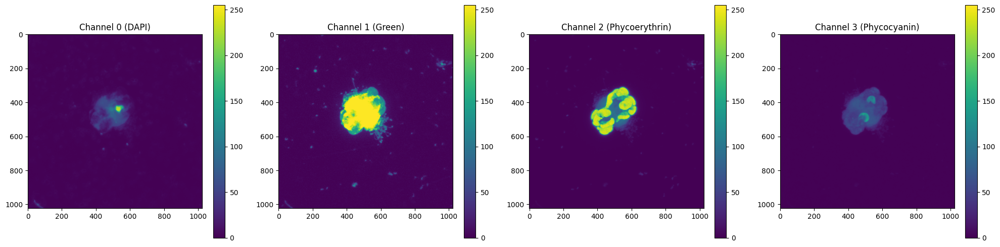

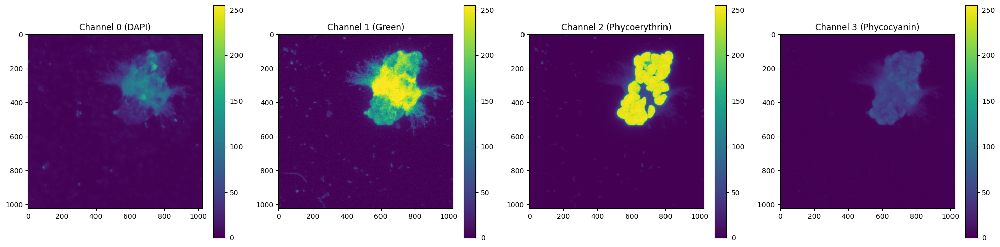

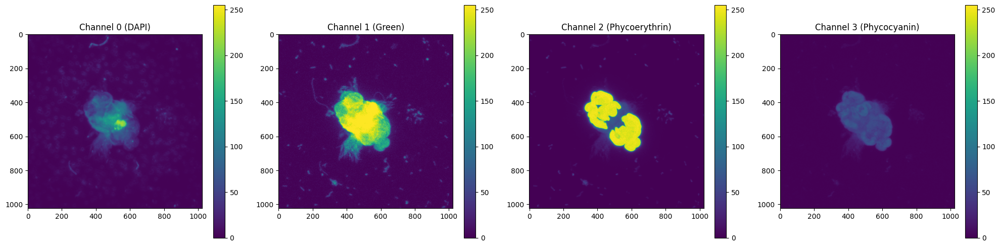

...

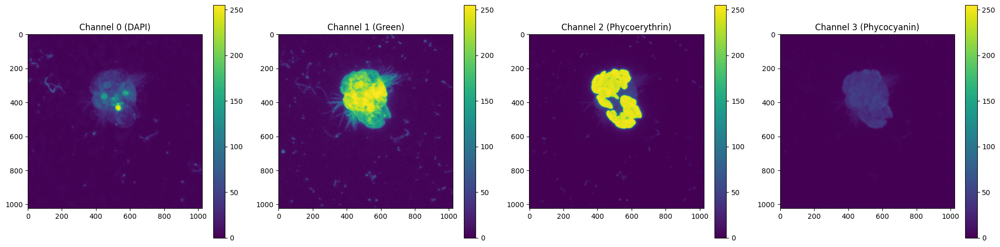

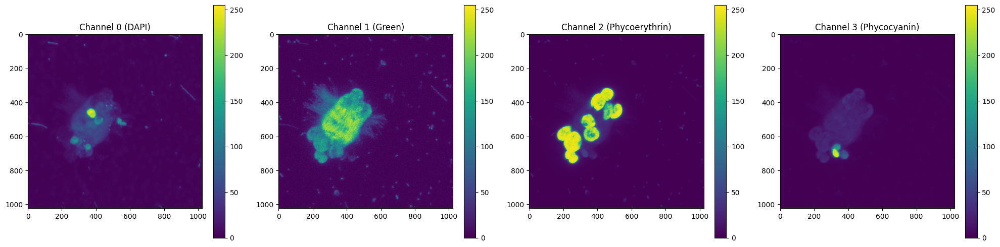

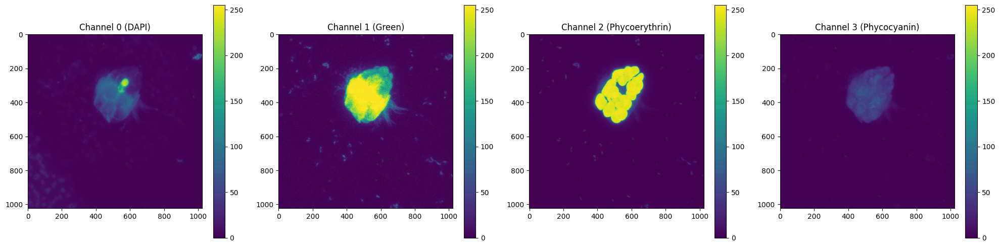

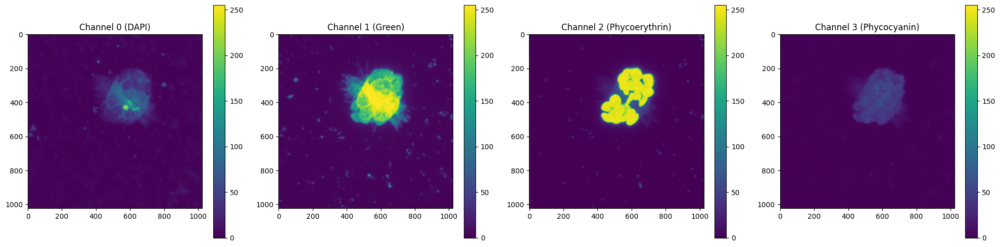

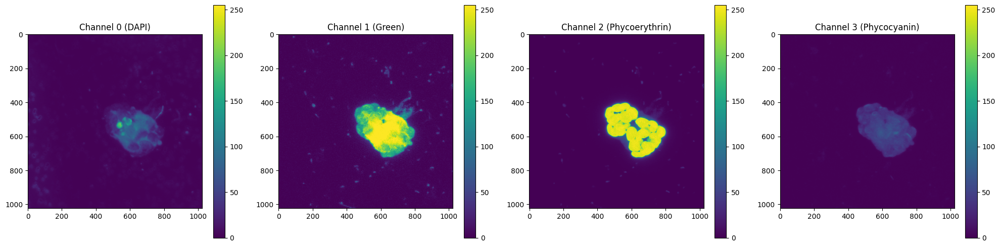

In [6]:
vminset = 0
vmaxset = 255

imgtitles = ['Channel 0 (DAPI)','Channel 1 (Green)','Channel 2 (Phycoerythrin)','Channel 3 (Phycocyanin)']

for filectr in range(0,len(D1_file_vector)):
    filename = D1_file_vector[filectr] # record the filename as a variable for later use in naming
    reader = read_lif.Reader(filename) # extract the data
    series = reader.getSeries() # extract the list of series

    for stack_choice in range(0,len(series)):
        chosen = series[stack_choice]  # choose z stack
        
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # 1 rows, 4 columns

        for channel_choice in range(0,4):
            image = chosen.getFrame(T=0,channel=channel_choice)
            img1 = axs[channel_choice].imshow(np.max(image, axis=0), cmap='viridis', vmin=vminset, vmax=vmaxset)
            axs[channel_choice].set_title(imgtitles[channel_choice])
            cbar1 = plt.colorbar(img1,ax=axs[channel_choice])
        
        # Adjust layout
        plt.tight_layout()
        
        # Show the plots
        #plt.show()
        plt.savefig("/Users/hollyvm/GoogleSync/Mesodinium/Mrubrum_fedHP/HighQualityImages/LIFs/Images/"+os.path.splitext(os.path.basename(filename))[0]+str(stack_choice)+".png")
